In [1]:
# Refer https://medium.com/machine-learning-world/feature-extraction-and-similar-image-search-with-opencv-for-newbies-3c59796bf774
import numpy as np
import urllib
import cv2
import os
import pickle
import random
import scipy
from scipy.misc import imread
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
base_globalpath = '/visual/folder/'
base_querypath = '/visual/query_images/'

In [3]:
def get_valid_image_files(folder_path):
    files = []
    for p in sorted(os.listdir(folder_path)):
        if p.endswith(".jpg"): 
            files.append(folder_path+"/"+p)
    return files
    

In [4]:
def extract_features(image_path, vector_size=32):
   
    image = imread(image_path, mode="RGB")
    try:
#     Using KAZE
        alg = cv2.KAZE_create()
#     Using SIFT
#         alg = cv2.xfeatures2d.SIFT_create()
#     Using SURF
#         alg = cv2.xfeatures2d.SURF_create()
        # Dinding image keypoints
        kps = alg.detect(image)
        # Getting first 32 of them. 
        # Number of keypoints is varies depend on image size and color pallet
        # Sorting them based on keypoint response value(bigger is better)
        kps = sorted(kps, key=lambda x: -x.response)[:vector_size]
        # computing descriptors vector
        kps, dsc = alg.compute(image, kps)
        # Flatten all of them in one big vector - our feature vector
        dsc = dsc.flatten()
        # Making descriptor of same size
        # Descriptor vector size is 64
        needed_size = (vector_size * 64)
        if dsc.size < needed_size:
            # if we have less the 32 descriptors then just adding zeros at the
            # end of our feature vector
            dsc = np.concatenate([dsc, np.zeros(needed_size - dsc.size)])
    except cv2.error as e:
        print('Error: ', e)
        return None

    return dsc


def batch_extractor(images_path, pickled_db_path=base_globalpath+'features.pck'):
    files = get_valid_image_files(images_path)

    result = {}
    for f in files: 
#         print 'Extracting features from image %s' % f
        name = f.split('/')[-1].lower()
        result[name] = extract_features(f)

    # saving all our feature vectors in pickled file
    with open(pickled_db_path, 'wb') as fp:
        pickle.dump(result, fp)

In [5]:
class Matcher(object):

    def __init__(self, pickled_db_path=base_globalpath+'features.pck'):
        with open(pickled_db_path,"rb") as fp:
            self.data = pickle.load(fp)
        self.names = []
        self.matrix = []
        for k, v in self.data.items():
            self.names.append(k)
            self.matrix.append(v)
        self.matrix = np.array(self.matrix)
        self.names = np.array(self.names)

    def cos_cdist(self, vector):
        # getting cosine distance between search image and images database
        v = vector.reshape(1, -1)
        return scipy.spatial.distance.cdist(self.matrix, v, 'cosine').reshape(-1)
#     distance.cdist(ref_1d[numpy.newaxis, :], query_2d)
    
#     def nearest_neighbors(values, all_values, nbr_neighbors=10):
#     nn = NearestNeighbors(nbr_neighbors, metric='cosine', algorithm='brute').fit(all_values)
#     dists, idxs = nn.kneighbors(values)

    def match(self, image_path, topn=5):
        features = extract_features(image_path)
        img_distances = self.cos_cdist(features)
        # getting top 5 records
        nearest_ids = np.argsort(img_distances)[:topn].tolist()
        nearest_img_paths = self.names[nearest_ids].tolist()
        return nearest_img_paths, img_distances[nearest_ids].tolist()

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until


Query image ==========================================


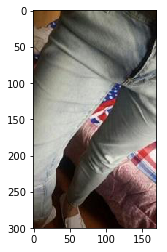

Result images ========================================
Match 1.0


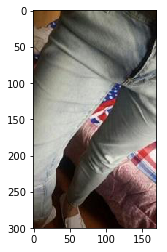

Match 0.6580894971673173


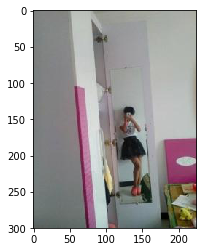

Match 0.648868438319225


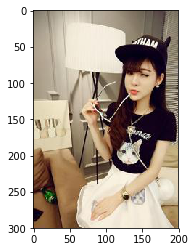

Match 0.6347470963162785


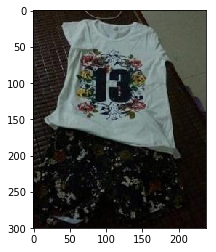

Match 0.6181750656504994


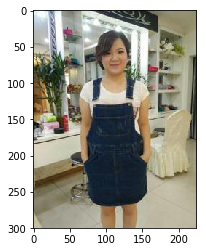

Query image ==========================================


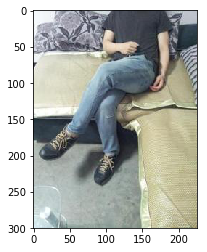

Result images ========================================
Match 1.0


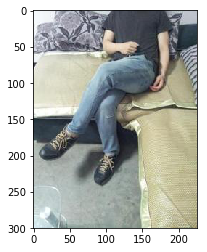

Match 0.6129566751276777


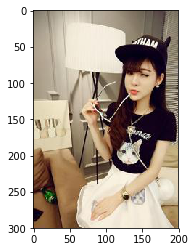

Match 0.5926678076437311


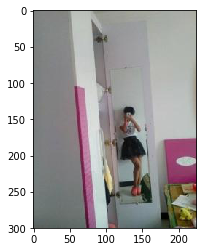

Match 0.5885376518440562


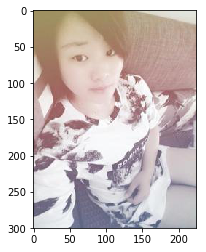

Match 0.5865654678050408


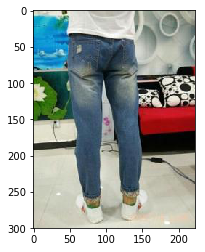

Query image ==========================================


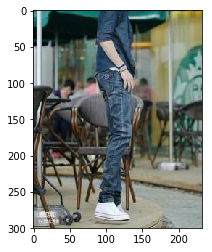

Result images ========================================
Match 1.0


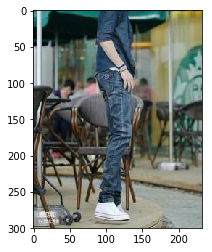

Match 0.5903703569771306


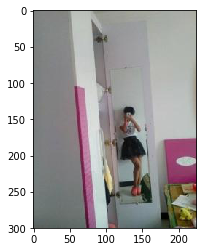

Match 0.5816447335904278


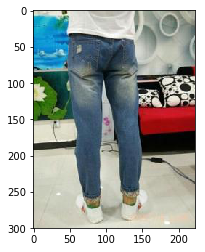

Match 0.5738015767050566


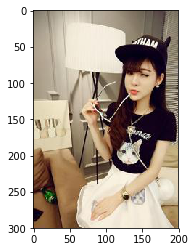

Match 0.5695869786474026


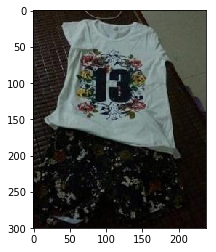

Query image ==========================================


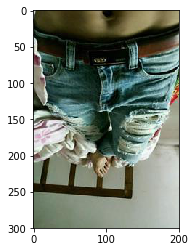

Result images ========================================
Match 0.9999999999999999


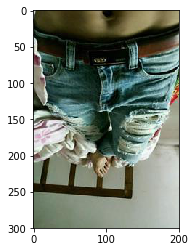

Match 0.6396003946514838


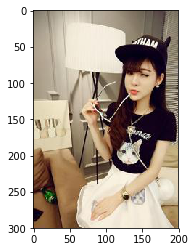

Match 0.632657944380924


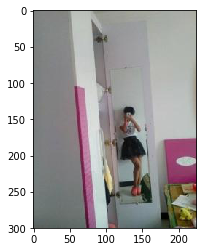

Match 0.6265507590030789


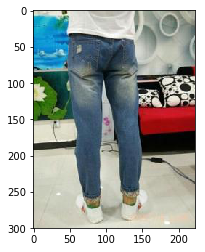

Match 0.6157984300692001


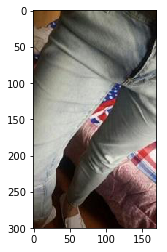

Query image ==========================================


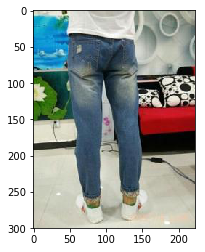

Result images ========================================
Match 1.0


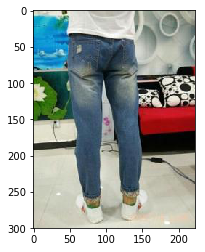

Match 0.6787421732317618


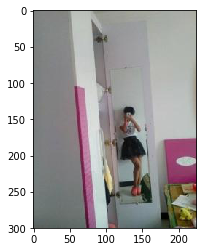

Match 0.6615777913811336


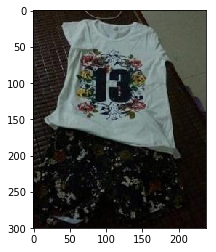

Match 0.660983280594817


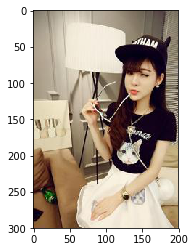

Match 0.6346682612423461


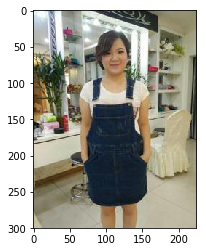

Query image ==========================================


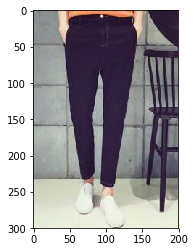

Result images ========================================
Match 0.9999999999999999


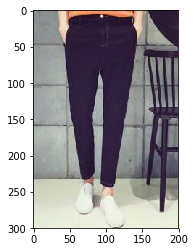

Match 0.5326738421385829


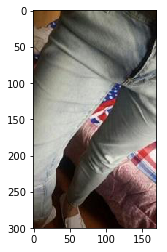

Match 0.5246811850089101


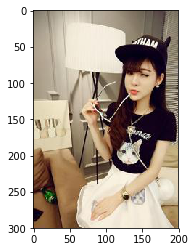

Match 0.523162620802888


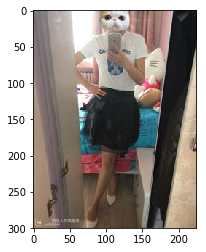

Match 0.5174950201946368


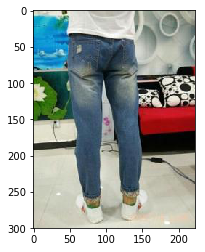

Query image ==========================================


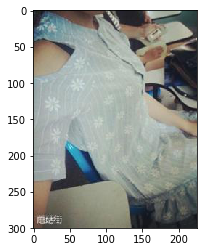

Result images ========================================
Match 1.0


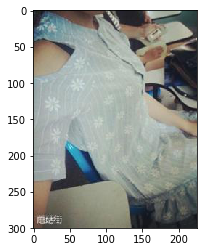

Match 0.5933332603156215


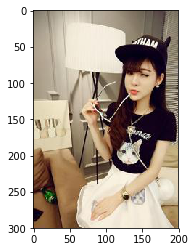

Match 0.583085461297269


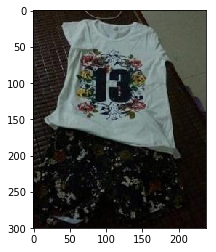

Match 0.5770249685433354


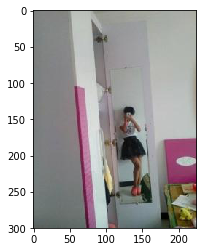

Match 0.5647560432818416


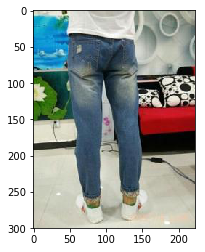

Query image ==========================================


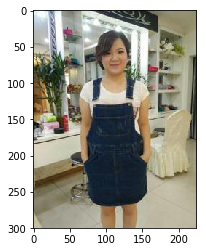

Result images ========================================
Match 1.0


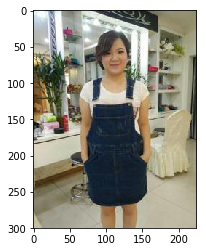

Match 0.66888236440023


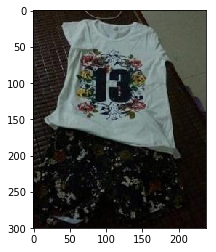

Match 0.6687854375896262


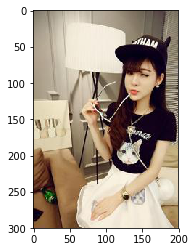

Match 0.6448094199218596


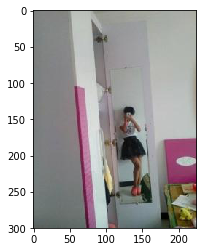

Match 0.6346682612423461


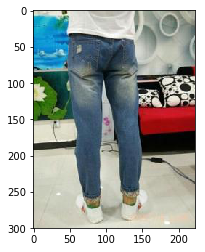

Query image ==========================================


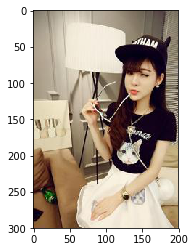

Result images ========================================
Match 0.9999999999999998


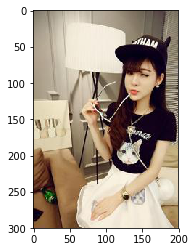

Match 0.6865595197508404


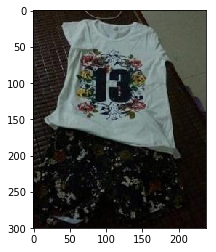

Match 0.6687854375896262


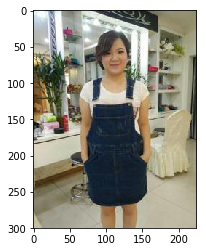

Match 0.6686643882246448


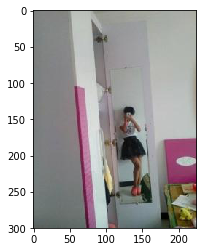

Match 0.660983280594817


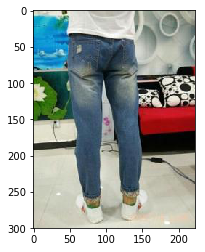

Query image ==========================================


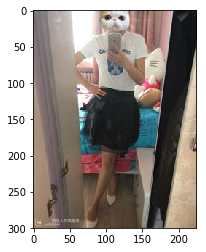

Result images ========================================
Match 0.9999999999999999


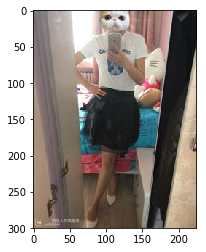

Match 0.6158912818374472


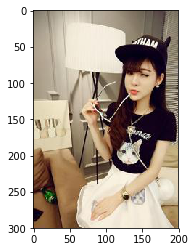

Match 0.6155623586295793


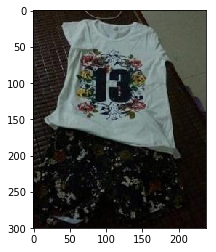

Match 0.614437319522135


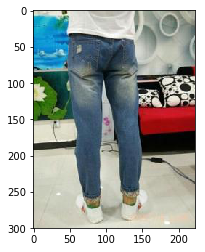

Match 0.6042677820937994


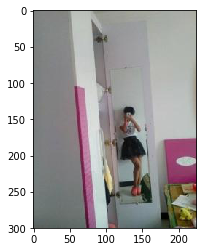

Query image ==========================================


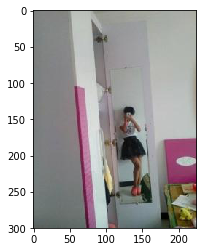

Result images ========================================
Match 1.0


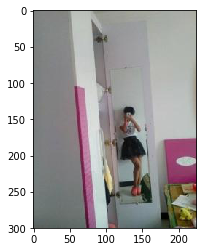

Match 0.6787421732317618


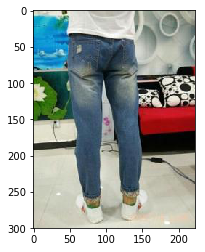

Match 0.6686643882246448


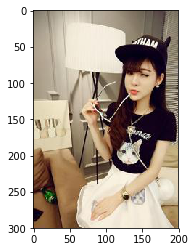

Match 0.6580894971673173


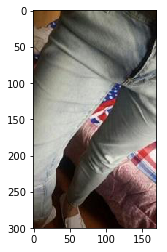

Match 0.6570948252697227


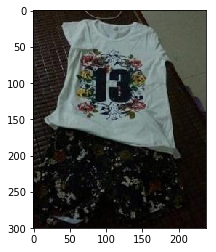

Query image ==========================================


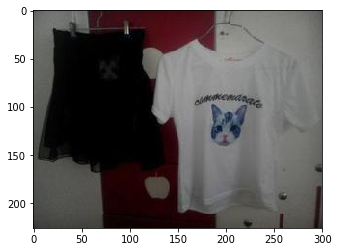

Result images ========================================
Match 1.0


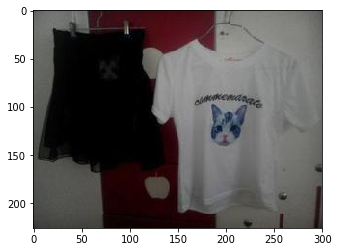

Match 0.5369077272486401


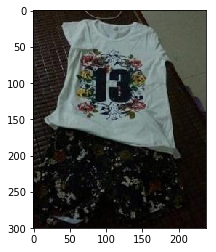

Match 0.5282202806348671


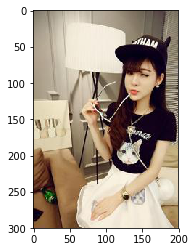

Match 0.5230541365418351


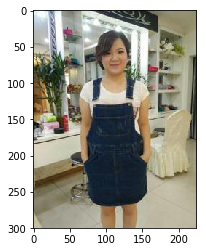

Match 0.5136183468221949


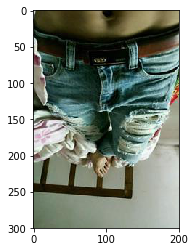

Query image ==========================================


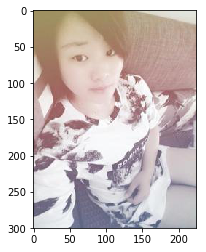

Result images ========================================
Match 1.0


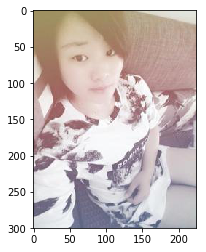

Match 0.6403405662298265


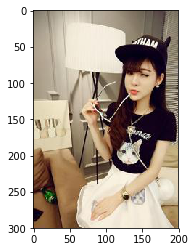

Match 0.6388485669395767


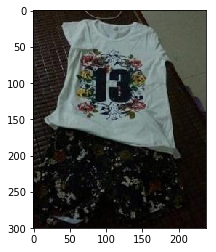

Match 0.6266994076883226


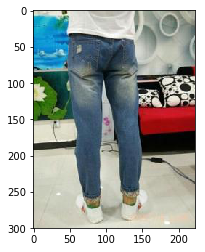

Match 0.6243498247362901


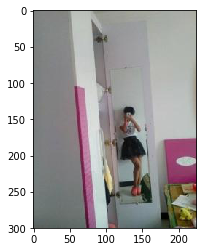

Query image ==========================================


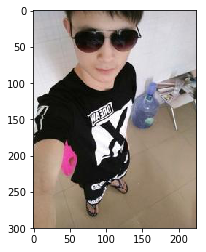

Result images ========================================
Match 1.0


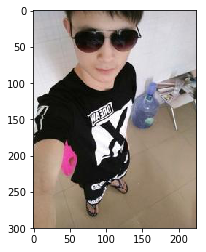

Match 0.5467636979257111


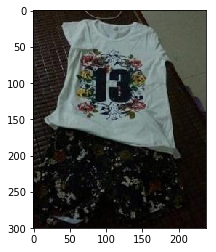

Match 0.5454724121500121


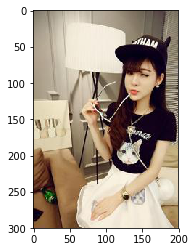

Match 0.545056644496558


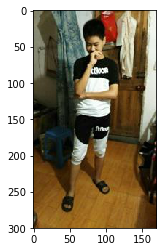

Match 0.5419971906155453


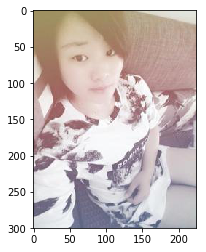

Query image ==========================================


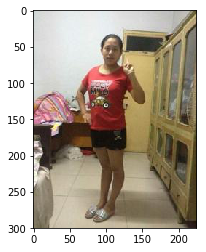

Result images ========================================
Match 1.0


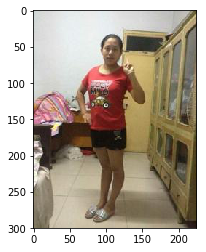

Match 0.6105668866292254


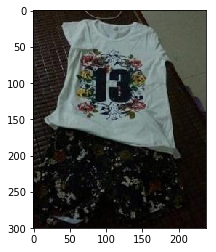

Match 0.5919125608024343


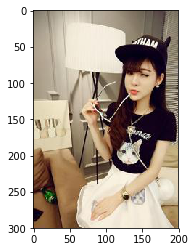

Match 0.5835068969807503


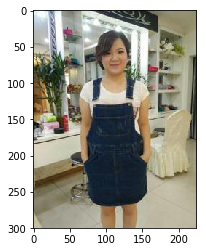

Match 0.5832771586924621


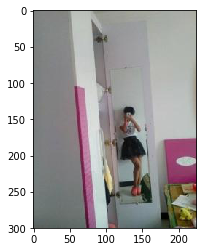

Query image ==========================================


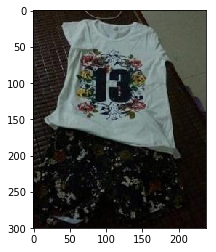

Result images ========================================
Match 1.0


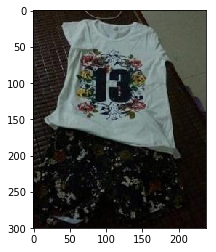

Match 0.6865595197508404


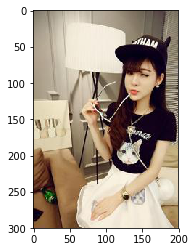

Match 0.66888236440023


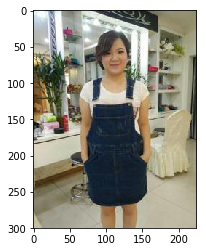

Match 0.6615777913811336


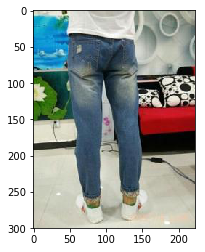

Match 0.6570948252697227


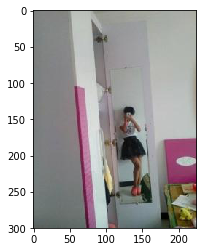

Query image ==========================================


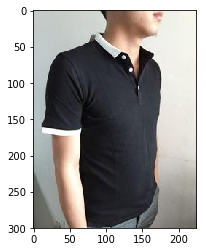

Result images ========================================
Match 1.0


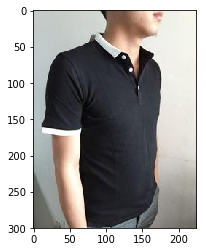

Match 0.46427639387557385


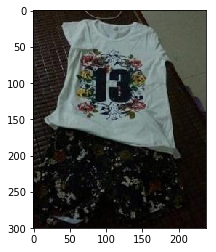

Match 0.46284804017842274


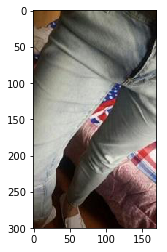

Match 0.45875692392531864


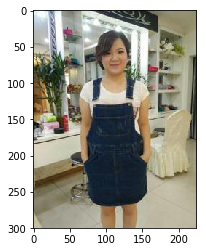

Match 0.4574205250831973


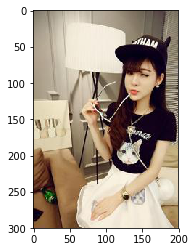

Query image ==========================================


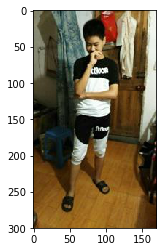

Result images ========================================
Match 1.0


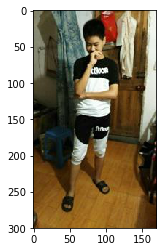

Match 0.6279646798386939


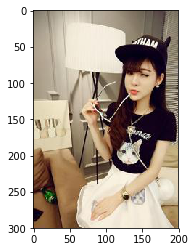

Match 0.6230934770033598


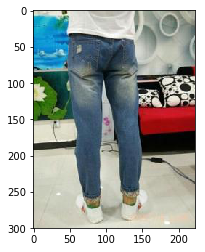

Match 0.6167401694069092


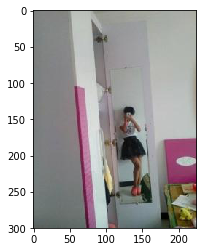

Match 0.6138535599696702


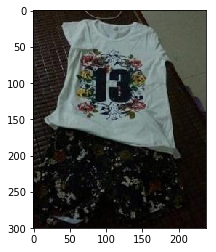

Query image ==========================================


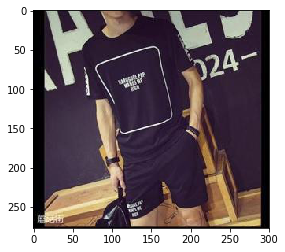

Result images ========================================
Match 1.0


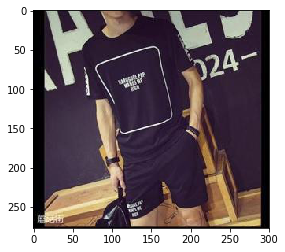

Match 0.5974189889243572


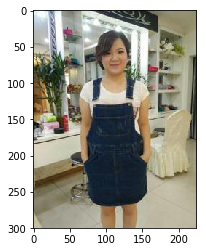

Match 0.5698014337417933


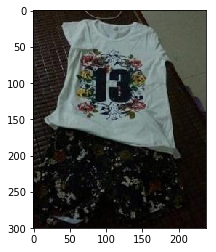

Match 0.5688774203047574


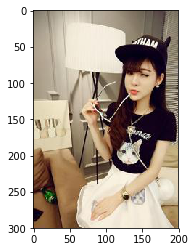

Match 0.5625065872067848


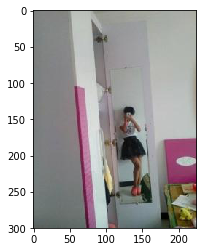

Query image ==========================================


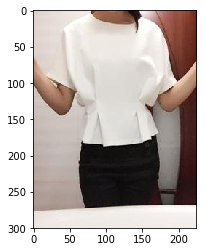

Result images ========================================
Match 1.0


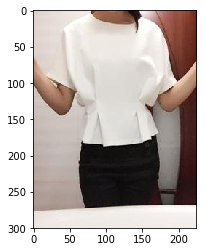

Match 0.5211999151962023


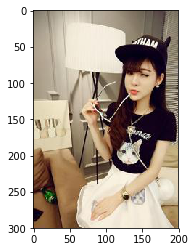

Match 0.49676700683563446


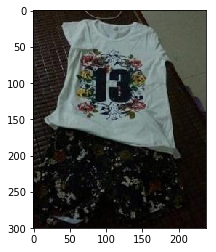

Match 0.48347642017090176


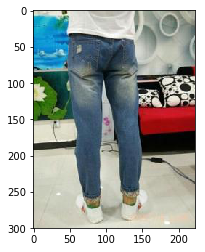

Match 0.4815137758862901


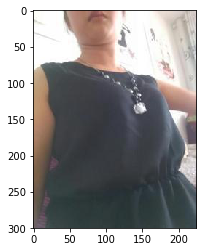

Query image ==========================================


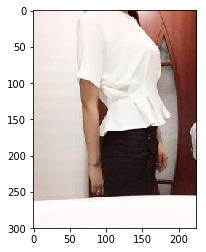

Result images ========================================
Match 1.0


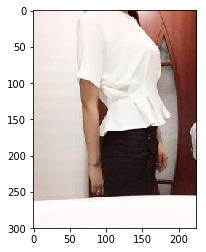

Match 0.5183786354749504


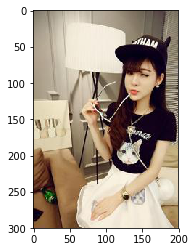

Match 0.5022213774765197


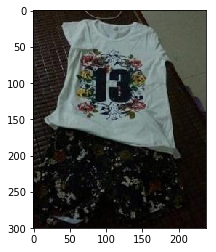

Match 0.49694245629421463


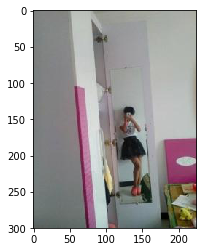

Match 0.48607664428508857


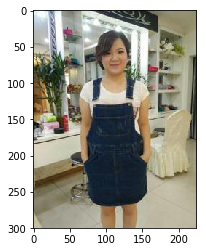

Query image ==========================================


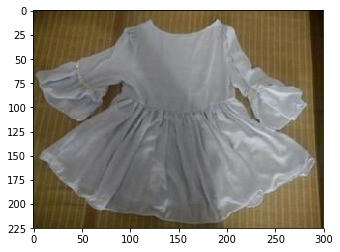

Result images ========================================
Match 1.0


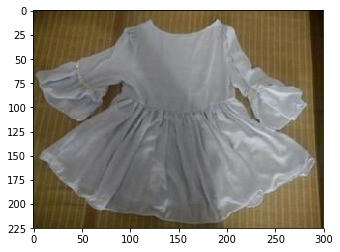

Match 0.576989223314433


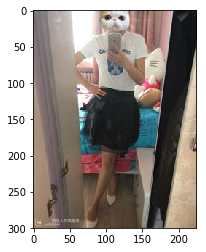

Match 0.5570702053624932


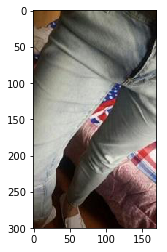

Match 0.5448308190890179


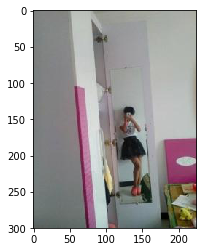

Match 0.5327006336769495


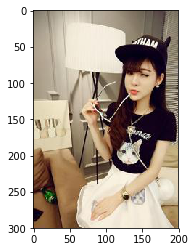

Query image ==========================================


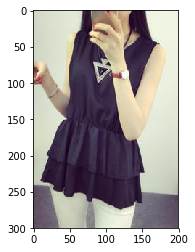

Result images ========================================
Match 0.9999999999999999


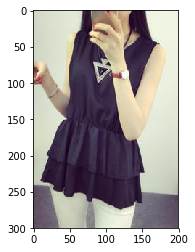

Match 0.500044625258349


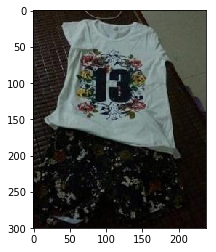

Match 0.497007133459481


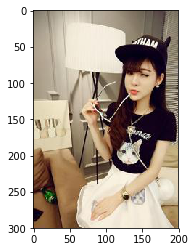

Match 0.49672608848802957


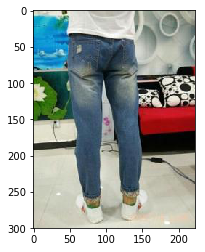

Match 0.48472567729690486


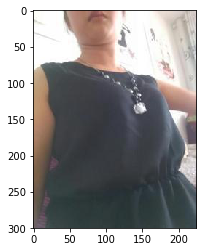

Query image ==========================================


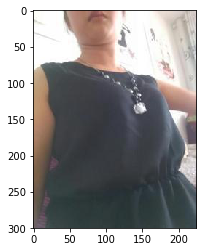

Result images ========================================
Match 1.0


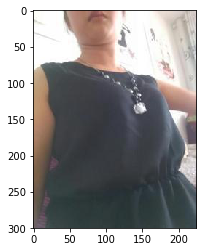

Match 0.5962843890054373


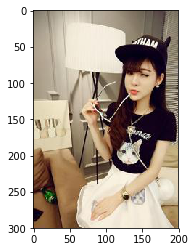

Match 0.5899638535933757


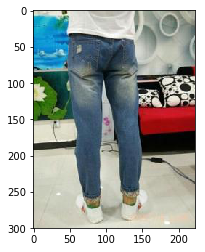

Match 0.5760318233085144


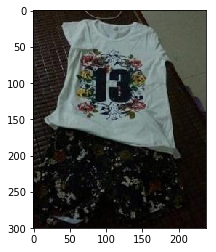

Match 0.5718417133231631


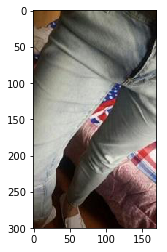

Query image ==========================================


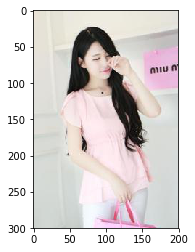

Result images ========================================
Match 1.0


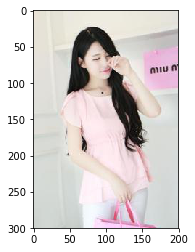

Match 0.6011759098325619


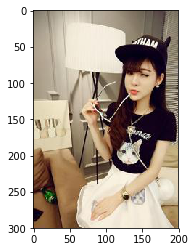

Match 0.5918170499756295


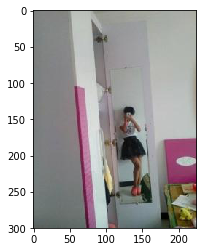

Match 0.5750256744559766


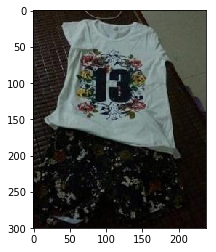

Match 0.5727881519642256


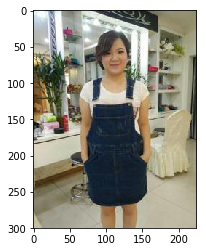

Query image ==========================================


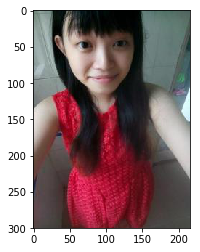

Result images ========================================
Match 1.0


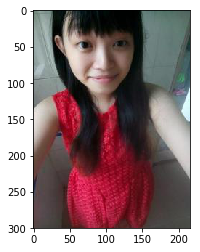

Match 0.4961687771827217


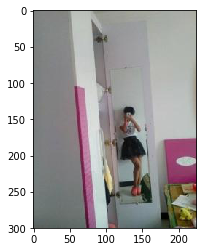

Match 0.4874332982744025


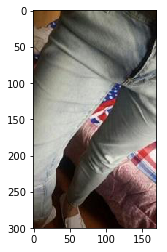

Match 0.4870073154270447


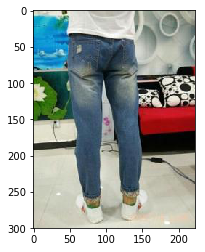

Match 0.48166526105210394


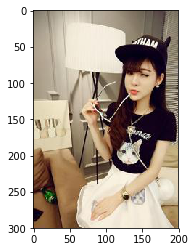

Query image ==========================================


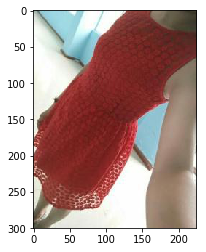

Result images ========================================
Match 1.0


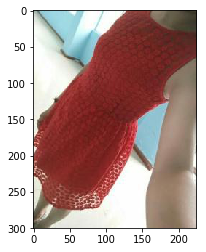

Match 0.3161919082877689


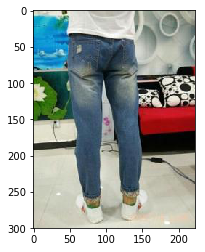

Match 0.29506816304480576


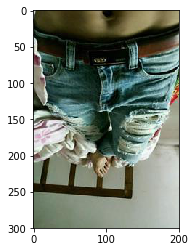

Match 0.2948065804282203


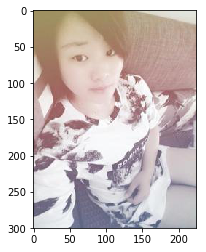

Match 0.2864734513347207


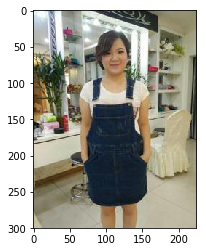

Query image ==========================================


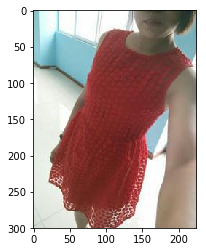

Result images ========================================
Match 1.0


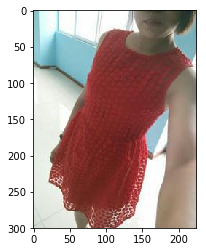

Match 0.47429074205079047


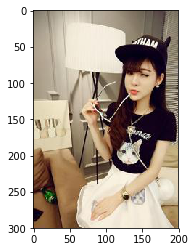

Match 0.45185921197024825


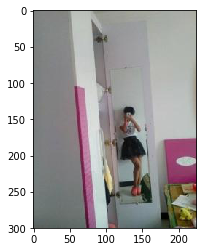

Match 0.45049298465769705


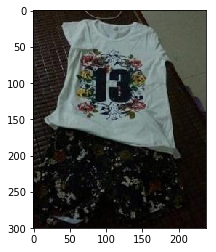

Match 0.4476381906356006


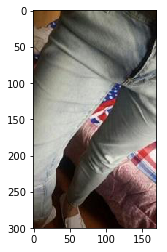

Query image ==========================================


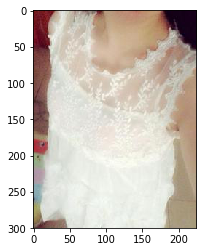

Result images ========================================
Match 1.0


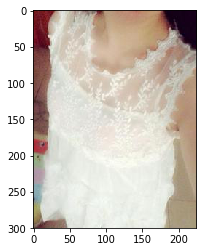

Match 0.436374655548467


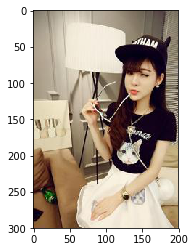

Match 0.40813182422463945


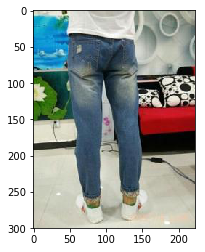

Match 0.4038614555905382


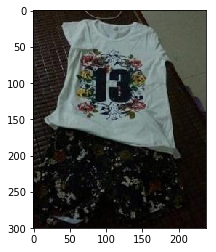

Match 0.3978670337878629


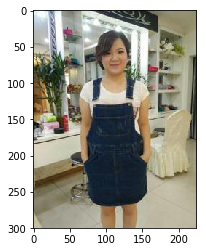

In [6]:

def show_img(path):
    img =imread(path, mode="RGB")
    plt.imshow(img)
    plt.show()

def run():
#     Query images to test
#     query_path = base_querypath
    category = 'all'
    images_path = base_globalpath+category
    files = get_valid_image_files(images_path)
#     Predicted dataset
    
#     images_path = base_globalpath+category
#     Store the features of the predicted dataset in the dataset
    batch_extractor(images_path)
    
    ma = Matcher(base_globalpath+'features.pck')
    
    for s in files:
       
        print('Query image ==========================================')
        show_img(s)
        names, match = ma.match(s, topn=5)
        print('Result images ========================================')
        for i in range(5):
            # we got cosine distance, less cosine distance between vectors
            # more they similar, thus we subtruct it from 1 to get match value
            print('Match %s' % (1-match[i]) )
            if names[i].endswith(".jpg"): 
                show_img(images_path+"/"+names[i])

run()